In [2]:
using LinearAlgebra
using Plots
using Printf

# Obhod lune

Imamo podane enačbe gibanja sonde

$\ddot{x} = x + 2 \dot{y} - \frac{\bar{\mu}}{R^3} (x + \mu) - \frac{\mu}{r^3} (x - \bar{\mu}), $

$\ddot{y} = y - 2 \dot{x} - \frac{\bar{\mu}}{R^3} y - \frac{\mu}{r^3} y, $

$\ddot{z} = - \frac{\bar{\mu}}{R^3} z - \frac{\mu}{r^3} z, $

kjer je

$R = R(x,y,z) = \sqrt{(x+\mu)^2 + y^2 + z^2}, $

$r = r(x,y,z) = \sqrt{(x-\bar{\mu})^2 + y^2 + z^2}. $

Sistem pretvorimo v enačbe prvega reda z uporabo novih spremenljivk ($v_x, v_y, v_z$)

$v_a = \dot{a}$,

$\dot{v_a} = \ddot{a}$.

Enačbe poenostavimo v ravnino (izpustimo $z$ dimenzijo), saj če v začetnih pogojih postavimo $z=0$ in $v_z=0$, potem se glede na $\ddot{z}$ nič ne spremeni (poleg tega se poenostavi vizualizacija...).

Sistem enačb prve stopnje je tako

$\dot{x} = v_x, $

$\dot{y} = v_y, $

$\dot{v_x} = x + 2 v_y - \frac{\bar{\mu}}{R^3} (x + \mu) - \frac{\mu}{r^3} (x - \bar{\mu}), $

$\dot{v_y} = y - 2 v_x - \frac{\bar{\mu}}{R^3} y - \frac{\mu}{r^3} y. $

Nov približek odvoda izračunamo v funkciji `f` spodaj.

In [1793]:
"""
    f(v, mu)

Izračuna nove vrednosti vhodnega približka v. mu je parameter razdalje, ki je vedno podan.
"""
function f(v, mu)
    x, y, vx, vy = v
    mu_ = 1-mu
    R3 = ((x+mu)^2+y^2)^(3/2)
    r3 = ((x-mu_)^2+y^2)^(3/2)
    vx_ = x + 2*vy - mu_*((x+mu)/R3) - mu*((x-mu_)/r3)
    vy_ = y - 2*vx - mu_*(y/R3) - mu*(y/r3)
    return [vx, vy ,vx_, vy_ ]
end

f

In [1806]:
"""
    step_mid(v, f, mu, h)

v - input vector
f - derivative function
mu - constant
h - step size
Makes one step of implicit midpoint method.
"""
function step_mid(v, f, mu, h)
    nv = copy(v) # nv is computed to be approximation for v_i+1 using iterative method 
    for i=1:5
        nv = v + (h/2) * (f(v, mu) + f(nv, mu))
    end
    v = v + h*f((v+nv)/2, mu)
    return v
end

step_mid

In [1807]:
"""
    step_rk(v, f, mu, h)

v - input vector
f - derivative function
mu - constant
h - step size
Makes one step of Runge-Kutta method.
"""
function step_rk(v, f, mu, h)
    k1 = h*f(v, mu)
    k2 = h*f(v+(k1/2), mu)
    k3 = h*f(v+(k2/2), mu)
    k4 = h*f(v+ k3, mu)
    v = v + (k1 + 2*k2 + 2*k3 + k4)/6
    return v
end

step_rk

In [1808]:
"""
    get_init_state_earth(vel, mu, angle_fl=-122.7, angle_corr=5)

vel - initial velocity
mu - constant
angle_fl - flight angle (kot glede na središče zemlje in lokacijo satelita ob začetku)
angle_corr - kot glede na smer leta (gledano kot odmik od tangente)
Vrne začetne pogoje glede na dane parametre. Začetek leta je nekje v Zemljini orbiti.
"""
function get_init_state_earth(vel, mu, angle_fl=-122.7, angle_corr=5) # koti - metoda ostrega pogleda
    a = angle_fl*pi/180 # rad
    b = angle_corr*pi/180.0  

    # velocity
    vx = vel * (sin(b) * cos(a) - cos(b) * sin(a))
    vy = vel * (sin(b) * sin(a) + cos(b) * cos(a))

    # position
    ds = 0.022 # "zemljin polmer + del orbite" v tem merilu, da se ohrani razdalja med luno in zemljo=1
    xrel = ds*cos(a)-mu
    yrel = ds*sin(a)

    return [xrel, yrel, vx, vy]
end

get_init_state_earth

In [1913]:
"""
    get_init_state_moon()

Vrne začetne pogoje, če je začetek leta nekje v lunini orbiti.
"""
function get_init_state_moon(n)
    # some Arenstorf orbits + some guessing
    s = [[0.994, 0, 0, -2.00158510637908],
        [0.994, 0, 0, -2.113898796694], #5.4368 
        [0.994, 0, 0, -2.031732629557], #11.1243 
        [1.2, 0, 0, -1.049357510],
        [1.2, 0, 0, -1.5],
        [0.994, 0, 0, -1.951]]
    return s[n]
end

get_init_state_moon

In [1917]:
"""
    compute_path(t, n)

v - začetno stanje
t - čas izvajanja
n - število korakov
mu - konstanta
alg - algoritem za aproksimacijo poti
Vrne vektor lokacij in hitrosti satelita skozi čas.
"""
function compute_path(v, t, n, mu, alg="rk")
    h = t/n
    # display(h)

    vals = zeros((n, 4))
    vals[1, :] = v
    for i=2:n
        if alg == "euler"
            vals[i, :] = vals[i-1, :] + h*f(vals[i-1, :], mu)
        elseif alg == "rk"
            vals[i, :] = step_rk(vals[i-1,:], f, mu, h)
        elseif alg == "mid"
            vals[i, :] = step_mid(vals[i-1,:], mu, h)
        end
    end

    return vals
end

compute_path

### Začetni pogoji

Za poti ki se začnejo iz Zemlje se "simulira" izstreljena sonda ki je že v orbiti in ima neko dovolj veliko hitrost, da lahko uide Zemljini gravitaciji, vendar ne preveliko, da se nato ujame v Lunino polje (in potem nazaj). Tako imamo pot ki je opisana v nalogi. Izstrelitveni koti so bili določeni na približno, in nato fiksirani da imamo čim manj parametrov. Nato se je spreminjala začetna hitrost sonde, tako da smo dosegli željene cilje (iterativno, zelo nestabilna zadeva, do neke točke algoritmično s povečevanjem/manjšanjem da se pride do lune, nato na roke).

Poti ki se začnejo iz Lune so določene z znanimi orbitami in nekaj ostalih eksperimentov.

0.012154535289174722

0.012154535289174722

4-element Vector{Float64}:
  1.2
  0.0
  0.0
 -1.5

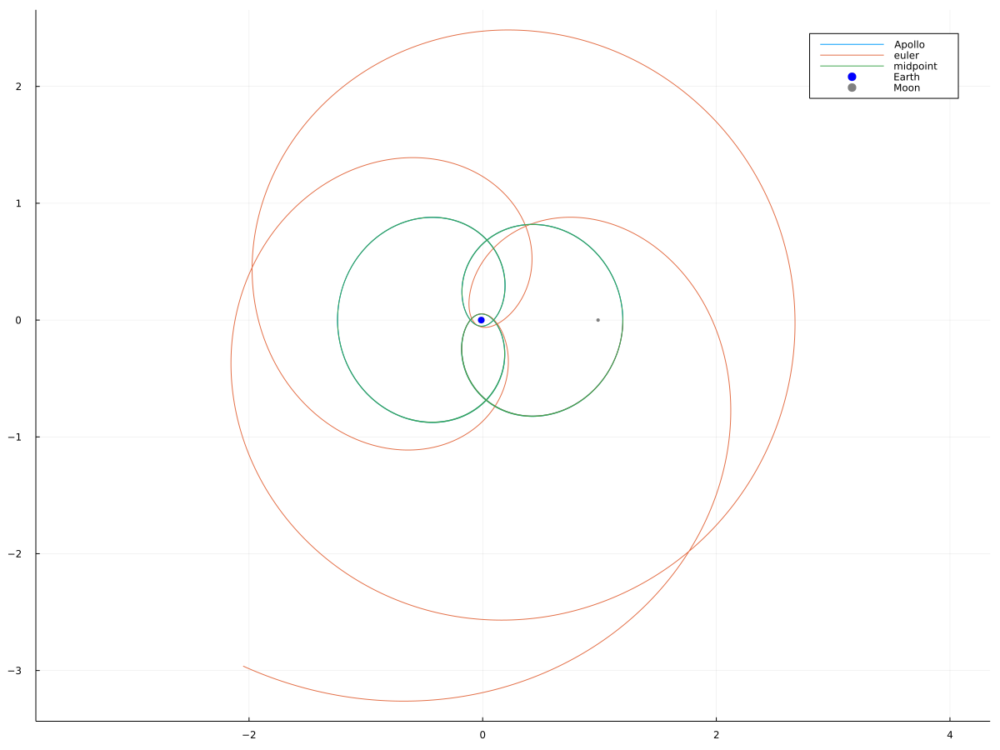

In [1920]:
M = 5.972 * 100 # masa zemlje
m = 7.348 # masa lune
mu = m/(m+M) # konstanta sistema
display(mu)
# mu = 0.012277471 # izračunana konstanta, standard(?), samo učasih razlika
display(mu)

# v = get_init_state_earth(9.3945, mu) # 1.25
v = get_init_state_moon(5)
display(v)

t = 15  #20#17.06521656
n = 100000

vals = compute_path(v, t, n, mu, "rk")
plot(vals[:,1], vals[:,2], size=(1200, 900), aspect_ratio=:equal, label="Apollo")

vals2 = compute_path(v, t, n, mu, "mid")
vals3 = compute_path(v, t, n, mu, "euler")
plot!(vals3[:,1], vals3[:,2], size=(1200, 900), aspect_ratio=:equal, label="euler")
plot!(vals2[:,1], vals2[:,2], size=(1200, 900), aspect_ratio=:equal, label="midpoint")

scatter!([-mu], [0], markersize=5, color=:blue, markerstrokewidth=0, label="Earth")
scatter!([1-mu], [0], markersize=3, color=:gray, markerstrokewidth=0, label="Moon")
# p = plot!()
# savefig(p, "imgs/moon-a6.png")

# display(p)

## Some images of run experiments

Pot sonde z začetkom v Zemlji, na desni sliki se vidi da tudi z uporabo Runge-Kutta metode pot ni stabilna (oz bi rabili tudi najti bolj natančen koeficient).

<img src="imgs/earth.png" width="900"><img src="imgs/earth_us.png" width="900">

Nekaj slik Arenstorf orbit oz znanih orbit z začetnimi parametri (kakšna tudi samo s poskušanjem različnih parametrov na roke). Primerjava različnih algoritmov, kjer je euler daleč najslabši, najboljša RK, vendar se tudi implicitna midpoint metoda obnese zelo dobro.

<img src="imgs/moon-a1.png" width="900">

<img src="imgs/moon-a2.png" width="900">

<img src="imgs/moon-a3.png" width="900">

<img src="imgs/moon-a4.png" width="900">

<img src="imgs/moon-a4-1.png" width="900">

<img src="imgs/moon-a5.png" width="900">

Random primer

<img src="imgs/moon-a6.png" width="900">